# Index
1. Introduction
2. Loading data
3. Exploring data
4. Training baseline model without any augumentations
5. Exploring augumentations
6. Training with augumentations

In [ ]:
#!pip install albumentations # libary with additional data augumentations

# Introduction
Challange text:
Food 101:
Food-101 is a challenging vision problem, but everyone can relate to it.  Recent SoTA is ~80% top-1, 90% top-5.  These approaches rely on lots of TTA, large networks and  even novel architectures.
 

## Goal

Get over 85% accuracy for top-1 on test set. Using ResNet50 or smaller network

## Dataset description:

This dataset consists of 101 food categories, with 101'000 images. 
For each class, 250 manually reviewed test images are provided as well as 750 training images. 
On purpose, the training images were not cleaned, and thus still contain some amount of noise. 
This comes mostly in the form of intense colors and sometimes wrong labels. 
All images were rescaled to have a maximum side length of 512 pixels.

From: https://www.tensorflow.org/datasets/catalog/food101

### Dataset

Dataset was dowloaded from: https://www.kaggle.com/dansbecker/food-101, because I was not able to locate original source at the time of starting this (https://vision.ee.ethz.ch/datasets_extra/food-101/ isn't working).

## Imports and helpers

In [1]:
from utils import *
from fastai2.vision.widgets import *
from fastai2.callback.fp16 import *
from fastai2.callback.cutmix import *
from fastai.widgets import ClassConfusion
import os

In [2]:
def shutdown(): 
    os.system('sudo shutdown -h now')
# utility function to shutdown vm after computation is finished

## Load data

In [3]:
path = Path('/home/jupyter/course-v4/nbs/food101/data/food-101/food-101')
path

Path('/home/jupyter/course-v4/nbs/food101/data/food-101/food-101')

In [4]:
path.ls()

[Path('/home/jupyter/course-v4/nbs/food101/data/food-101/food-101/README.txt'),
 Path('/home/jupyter/course-v4/nbs/food101/data/food-101/food-101/.DS_Store'),
 Path('/home/jupyter/course-v4/nbs/food101/data/food-101/food-101/images'),
 Path('/home/jupyter/course-v4/nbs/food101/data/food-101/food-101/license_agreement.txt'),
 Path('/home/jupyter/course-v4/nbs/food101/data/food-101/food-101/meta')]

## Look at the data

In [4]:
# check how many files there are, how many classes there are, what is the resolution of files

In [5]:
food101 = DataBlock(
        blocks=(ImageBlock, CategoryBlock),
        get_items=get_image_files,
        splitter=RandomSplitter(valid_pct=0.2, seed=42),
        get_y=parent_label, 
        item_tfms=Resize(512))

In [6]:
dls = food101.dataloaders(path)

### How classes look and how classes many are there

In [8]:
dls.train.vocab, len(dls.train.vocab)

((#101) ['apple_pie','baby_back_ribs','baklava','beef_carpaccio','beef_tartare','beet_salad','beignets','bibimbap','bread_pudding','breakfast_burrito'...],
 101)

### Check size of train and validation dataloades

In [9]:
len(dls.train), len(dls.valid)

(1262, 316)

## How many files there are

In [38]:
fnames = get_image_files(path)

In [11]:
len(fnames)

101000

## Check resolution of images

In [12]:
import PIL
size_d = {k: PIL.Image.open(k).size for k in fnames}

row_sz, col_sz = list(zip(*size_d.values()))
row_sz = np.array(row_sz); col_sz = np.array(col_sz)

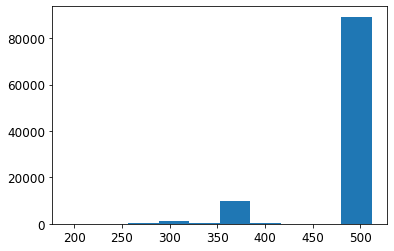

In [13]:
plt.hist(row_sz);

## Explore example images

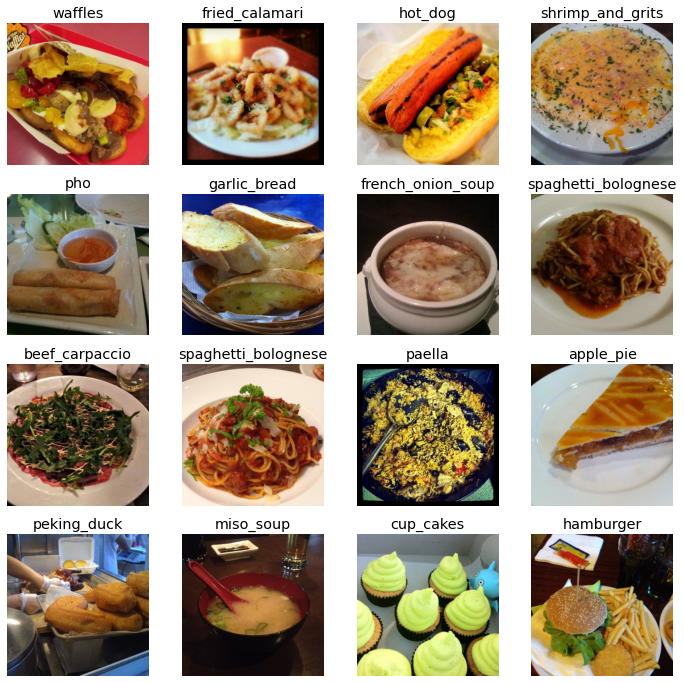

In [15]:
dls = food101.dataloaders(path)
dls.valid.show_batch(max_n=16, nrows=4)

Given the images and the dataset background we can clearly see that data has most flaws of user generated photos.

Saturation and lighting quality vary a lot, same with focus.
Perspective varies and there are sometimes other items beside the main dish (like french fries for the hamburger or spring rolls for pho).

### Resized how the baseline will be trained

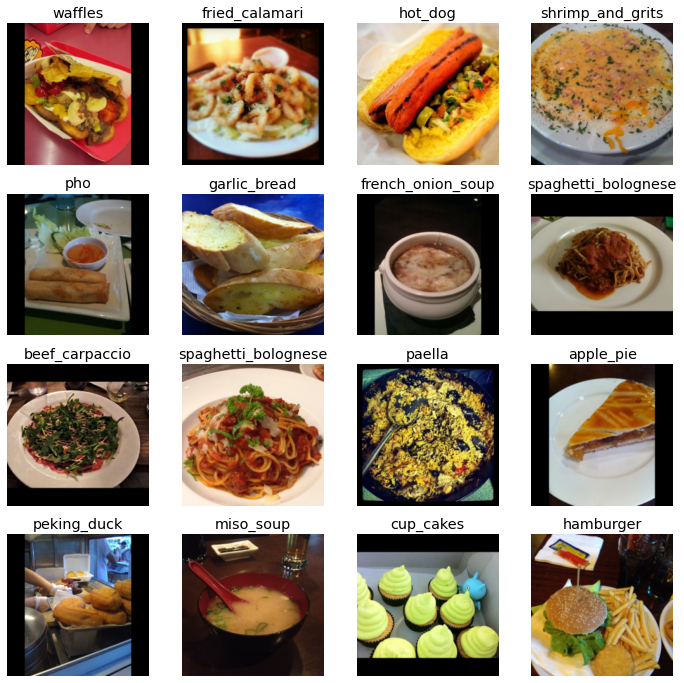

In [16]:
food101 = food101.new(item_tfms=Resize(224, ResizeMethod.Pad, pad_mode='zeros'))
dls = food101.dataloaders(path)
dls.valid.show_batch(max_n=16, nrows=4)

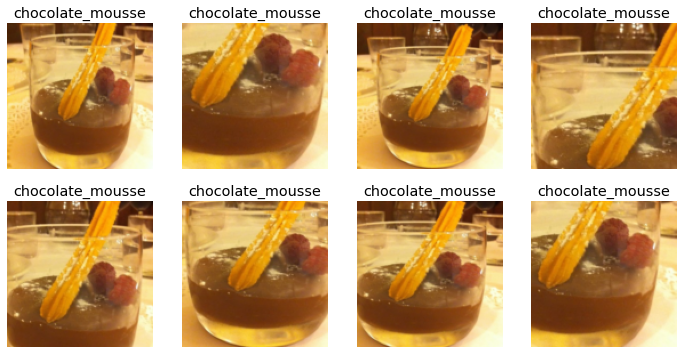

In [17]:
food101 = food101.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = food101.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

### Explore different Data Augmentation

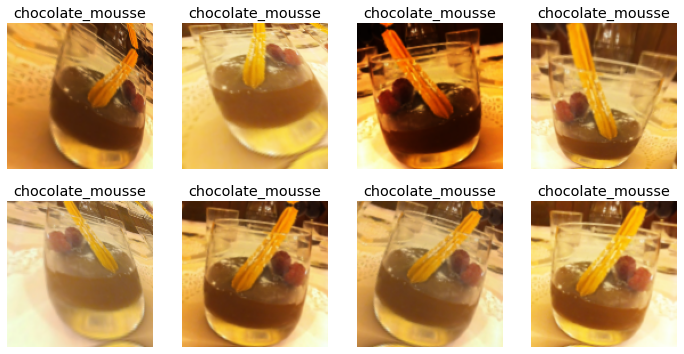

In [18]:
food101 = food101.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = food101.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

## Training the model with resnet34 without any tmfs as baseline

In [23]:
top_5_accuracy = partial(top_k_accuracy, k=5)
top_1_accuracy = partial(top_k_accuracy, k=1)
top_5_accuracy.__name__ = 'top5_accuracy'
top_1_accuracy.__name__ = 'top1_accuracy' # TODO fix showing them while training

In [24]:
metrics = [error_rate, top_1_accuracy, top_5_accuracy]

In [21]:
food101 = food101.new(
    item_tfms=Resize(224, ResizeMethod.Pad, pad_mode='zeros'), # using pad with zeroes for baseline
# so no information will eb lost
    batch_tfms=None)
dls = food101.dataloaders(path)

In [22]:
learn = cnn_learner(dls, resnet34, metrics=metrics)

In [15]:
learn.fine_tune(12)

epoch,train_loss,valid_loss,error_rate,top_k_accuracy,top_k_accuracy,time
0,2.182736,1.774992,0.455941,0.544059,0.806287,11:50


epoch,train_loss,valid_loss,error_rate,top_k_accuracy,top_k_accuracy,time
0,1.488242,1.247759,0.330396,0.669604,0.884059,06:06
1,1.264862,1.147903,0.301584,0.698416,0.898168,06:06
2,1.108430,1.134368,0.292030,0.707970,0.899901,06:07
3,0.885928,1.109741,0.284406,0.715594,0.904604,06:06
4,0.647195,1.123091,0.279059,0.720941,0.908663,06:07
5,0.442297,1.214335,0.276881,0.723119,0.908218,06:07
6,0.260412,1.251194,0.270743,0.729257,0.908564,06:07
7,0.143242,1.310916,0.265149,0.734851,0.910446,06:07
8,0.069562,1.331691,0.259703,0.740297,0.912129,06:07
9,0.036961,1.344650,0.250941,0.749059,0.914307,06:08


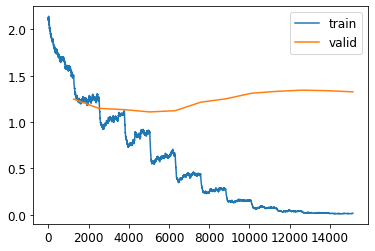

In [16]:
learn.recorder.plot_loss()

In [17]:
learn.save('baseline')

In [9]:
learn.load('baseline')

In [31]:
interp = ClassificationInterpretation.from_learner(learn)

In [32]:
interp.most_confused(min_val=3), len(interp.most_confused(min_val=3))

([('chocolate_mousse', 'chocolate_cake', 29),
  ('ramen', 'pho', 28),
  ('scallops', 'gnocchi', 26),
  ('ravioli', 'gnocchi', 25),
  ('spaghetti_carbonara', 'spaghetti_bolognese', 25),
  ('tuna_tartare', 'beef_tartare', 25),
  ('bread_pudding', 'apple_pie', 23),
  ('crab_cakes', 'falafel', 23),
  ('shrimp_and_grits', 'risotto', 23),
  ('beignets', 'donuts', 22),
  ('sashimi', 'sushi', 22),
  ('ice_cream', 'frozen_yogurt', 21),
  ('pork_chop', 'grilled_salmon', 21),
  ('pork_chop', 'steak', 20),
  ('foie_gras', 'scallops', 19),
  ('chocolate_cake', 'chocolate_mousse', 18),
  ('filet_mignon', 'steak', 18),
  ('lasagna', 'pizza', 18),
  ('dumplings', 'gyoza', 17),
  ('prime_rib', 'steak', 17),
  ('shrimp_and_grits', 'gnocchi', 17),
  ('steak', 'filet_mignon', 16),
  ('croque_madame', 'eggs_benedict', 15),
  ('french_toast', 'pancakes', 15),
  ('grilled_cheese_sandwich', 'garlic_bread', 15),
  ('tiramisu', 'chocolate_mousse', 15),
  ('huevos_rancheros', 'nachos', 14),
  ('onion_rings', 'fr

## Baseline result conclusion

In [ ]:
Top of most confused are some dishes that would get easily confused by human (like chocolate mousse and cake, ramen and pho).
But below there are some classes that should in theory easily been told apart like waffles and pizza

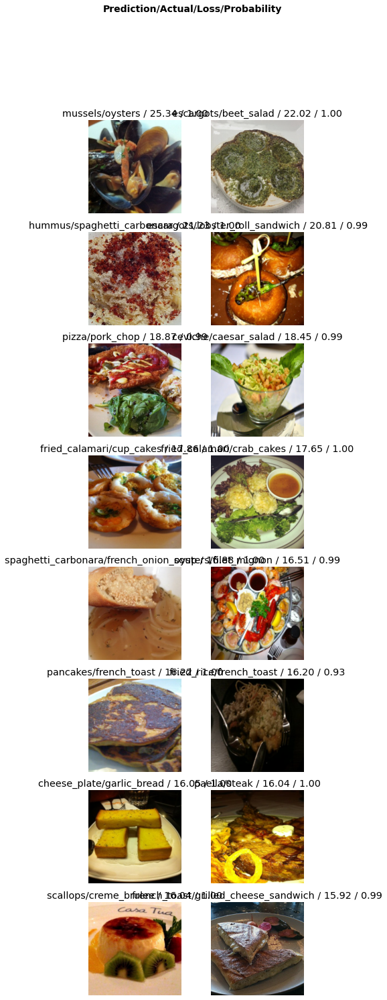

In [34]:
interp.plot_top_losses(16, nrows=8)

In [89]:
interp.plot_confusion_matrix(figsize=(12,12), dpi=600)

## Transforms

### RandomResizedCrop

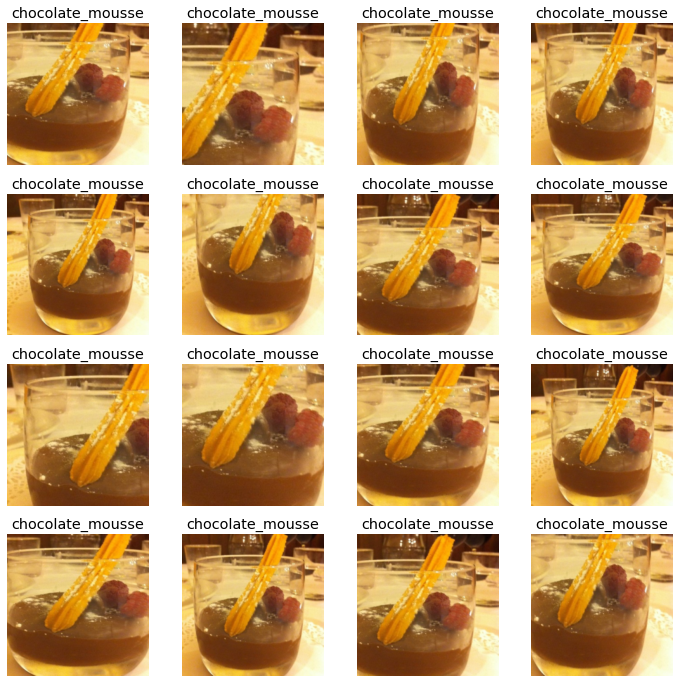

In [24]:
food101 = food101.new(item_tfms=RandomResizedCrop(224, min_scale=0.3))
dls = food101.dataloaders(path)
dls.train.show_batch(max_n=16, nrows=4, unique=True)

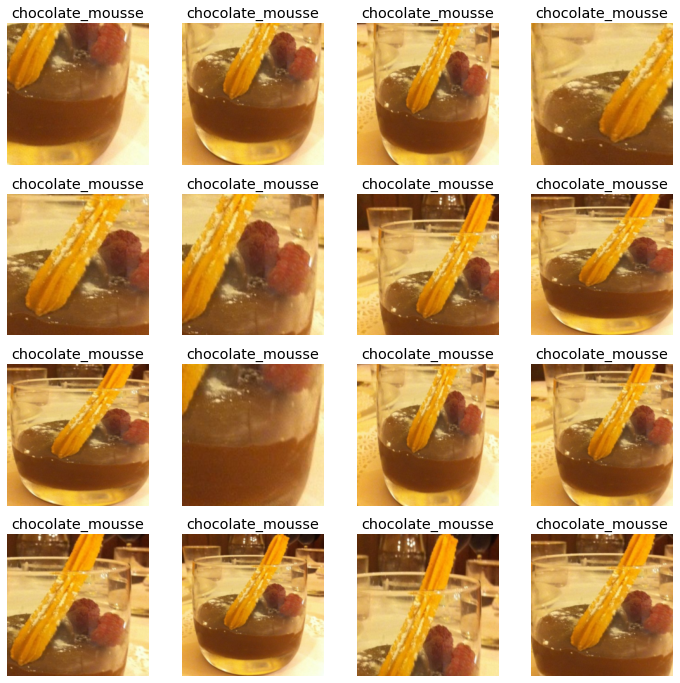

In [25]:
food101 = food101.new(item_tfms=RandomResizedCrop(224, min_scale=0.1))
dls = food101.dataloaders(path)
dls.train.show_batch(max_n=16, nrows=4, unique=True)

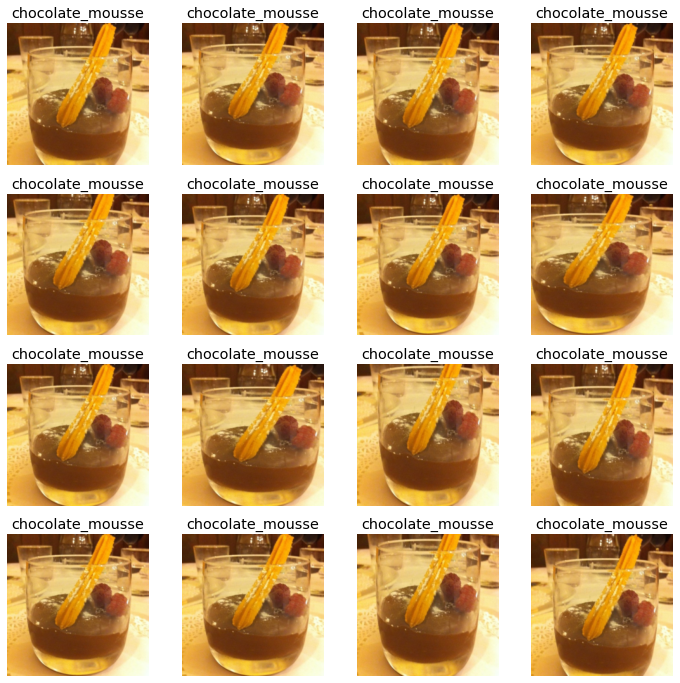

In [26]:
food101 = food101.new(item_tfms=RandomResizedCrop(224, min_scale=0.8))
dls = food101.dataloaders(path)
dls.train.show_batch(max_n=16, nrows=4, unique=True)

### Default Aug transforms

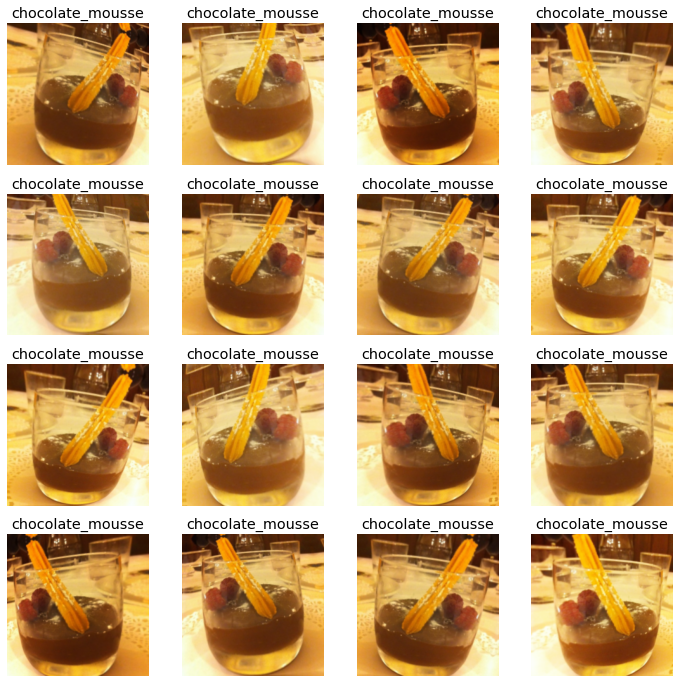

In [27]:
# with default parameters, but passed explicitly so we can see what is exactly happening here
food101 = food101.new(item_tfms=Resize(224), batch_tfms=aug_transforms(
   mult=1.0,
    do_flip=True,
    flip_vert=False,
    max_rotate=10.0,
    max_zoom=1.1,
    max_lighting=0.2,
    max_warp=0.2,
    p_affine=0.75,))
dls = food101.dataloaders(path)
dls.train.show_batch(max_n=16, nrows=4, unique=True)

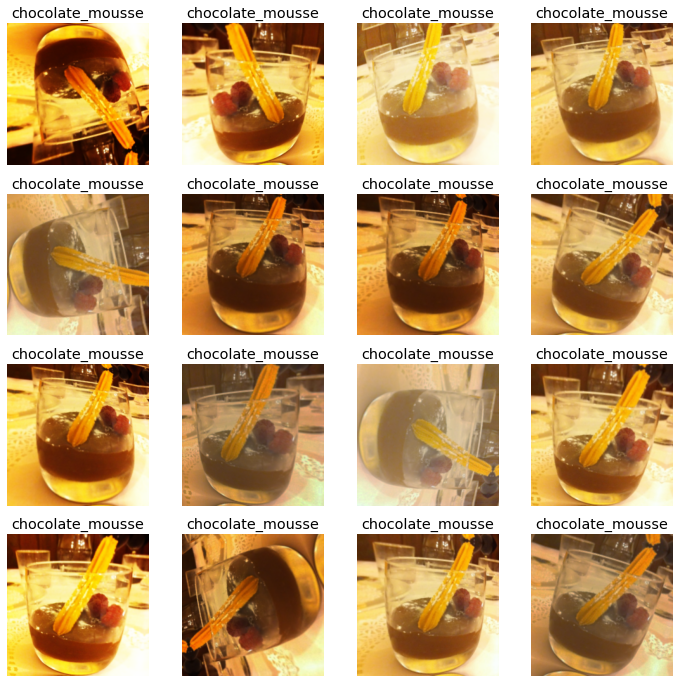

In [28]:
food101 = food101.new(item_tfms=Resize(224), batch_tfms=aug_transforms(
   mult=1.0,
    do_flip=True,
    flip_vert=True, #flip_vert enabled
    max_rotate=20.0, #max rotate from 10 to 20
    max_zoom=1, # because we will zoom in resize fn
    max_lighting=0.5, #max lightint from 0.1 to 0.5
    max_warp=0.2,
    p_affine=0.75,))
dls = food101.dataloaders(path)
dls.train.show_batch(max_n=16, nrows=4, unique=True)

### Training with random crop

In [29]:
food101 = food101.new(item_tfms=RandomResizedCrop(224, min_scale=0.1))
dls = food101.dataloaders(path)

In [28]:
learn = cnn_learner(dls, resnet34, metrics=metrics)
learn.fine_tune(12)

epoch,train_loss,valid_loss,error_rate,top_k_accuracy,top_k_accuracy,time
0,2.461040,1.756181,0.447426,0.552574,0.808614,04:27


epoch,train_loss,valid_loss,error_rate,top_k_accuracy,top_k_accuracy,time
0,1.768335,1.259564,0.327525,0.672475,0.881782,06:11
1,1.590913,1.129482,0.295891,0.704109,0.899653,06:11
2,1.511741,1.087346,0.286337,0.713663,0.906832,06:11
3,1.392356,1.016020,0.269703,0.730297,0.914752,06:11
4,1.254473,0.980416,0.260396,0.739604,0.918119,06:11
5,1.162327,0.895876,0.234208,0.765792,0.928069,06:11
6,1.044692,0.856990,0.222079,0.777921,0.932723,06:11
7,0.865037,0.819731,0.212178,0.787822,0.937079,06:11
8,0.772704,0.800106,0.203812,0.796188,0.941040,06:11
9,0.681118,0.773287,0.196238,0.803762,0.942970,06:11


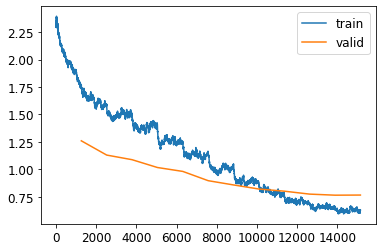

In [29]:
learn.recorder.plot_loss()

In [30]:
learn.save('random-crop')

### Training with aug transforms

In [31]:
food101 = food101.new(item_tfms=Resize(224), batch_tfms=aug_transforms(
   mult=1.0,
    do_flip=True,
    flip_vert=True, #flip_vert enabled
    max_rotate=20.0, #max rotate from 10 to 20
    max_zoom=1, # because we will zoom in resize fn
    max_lighting=0.5, #max lightint from 0.1 to 0.5
    max_warp=0.2,
    p_affine=0.75,))
dls = food101.dataloaders(path)

In [32]:
learn = cnn_learner(dls, resnet34, metrics=metrics)
learn.fine_tune(12)

epoch,train_loss,valid_loss,error_rate,top_k_accuracy,top_k_accuracy,time
0,2.466053,1.769448,0.453960,0.546040,0.811386,04:45


epoch,train_loss,valid_loss,error_rate,top_k_accuracy,top_k_accuracy,time
0,1.722604,1.263956,0.330743,0.669257,0.882030,06:29
1,1.501801,1.129977,0.298614,0.701386,0.901386,06:28
2,1.454041,1.073565,0.283020,0.716980,0.908069,06:29
3,1.288857,1.019170,0.269307,0.730693,0.914158,06:29
4,1.164320,0.954371,0.255049,0.744950,0.922327,06:29
5,1.002596,0.927603,0.239752,0.760248,0.925545,06:28
6,0.946786,0.860473,0.223960,0.776040,0.935050,06:29
7,0.819406,0.820241,0.214851,0.785149,0.938663,06:28
8,0.713832,0.784230,0.201931,0.798069,0.943366,06:29
9,0.628592,0.757588,0.194307,0.805693,0.945743,06:29


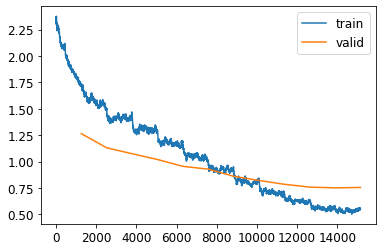

In [33]:
learn.recorder.plot_loss()

In [34]:
learn.save('aug-tmfs')

### Training with random crop + aug transforms

In [35]:
food101 = food101.new(item_tfms=RandomResizedCrop(224, min_scale=0.1), batch_tfms=aug_transforms(
   mult=1.0,
    do_flip=False,
    max_rotate=20.0, #max rotate from 10 to 20
    max_zoom=1, # because we will zoom in resize fn
    max_lighting=0.5, #max lightint from 0.1 to 0.5 - because in the example images lighting varied a lot
    max_warp=0.2,
    p_affine=0.75,))
dls = food101.dataloaders(path)

In [36]:
learn = cnn_learner(dls, resnet34, metrics=metrics)
learn.fine_tune(12)

epoch,train_loss,valid_loss,error_rate,top_k_accuracy,top_k_accuracy,time
0,2.765832,1.860806,0.470594,0.529406,0.791733,04:45


epoch,train_loss,valid_loss,error_rate,top_k_accuracy,top_k_accuracy,time
0,2.048594,1.338133,0.348911,0.651089,0.873861,06:29
1,1.895811,1.196506,0.312970,0.687030,0.893416,06:29
2,1.779285,1.177146,0.314307,0.685693,0.897129,06:29
3,1.650972,1.100798,0.291436,0.708564,0.906881,06:28
4,1.587641,1.023091,0.273069,0.726931,0.914059,06:29
5,1.437917,0.958666,0.255495,0.744505,0.923564,06:29
6,1.355054,0.870512,0.229802,0.770198,0.931188,06:30
7,1.220966,0.834548,0.222277,0.777723,0.935000,06:29
8,1.153759,0.785941,0.209059,0.790941,0.940941,06:29
9,1.114908,0.755105,0.199109,0.800891,0.944059,06:29


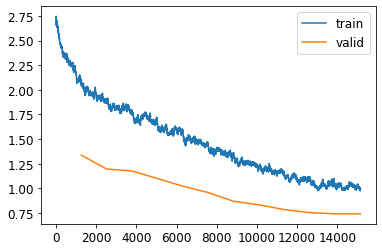

In [37]:
learn.recorder.plot_loss()

In [38]:
learn.save('aug-tmfs-random-crop')

## Adding augumentations from Albumentations

I'd like to experiment a bit with saturation, blur, sharpen and possibly ShiftScaleRotate, so we can augument the dataset and crappify the rest of the pictures with the flaws that can be seen in user submitted phographs.

In [7]:
from albumentations import ShiftScaleRotate, GaussianBlur, HueSaturationValue, IAASharpen

In [8]:
img = load_image('/home/jupyter/course-v4/nbs/food101/data/food-101/food-101/images/apple_pie/416233.jpg')

In [9]:
def gaussian_blur(img):
    aug = GaussianBlur(p=1)
    np_img = np.array(img)
    aug_img = aug(image=np_img)['image']
    return PILImage.create(aug_img)

def hue_saturation_value(img):
    aug = HueSaturationValue(p=1)
    np_img = np.array(img)
    aug_img = aug(image=np_img)['image']
    return PILImage.create(aug_img)

def sharpen(img):
    aug = IAASharpen(p=1)
    np_img = np.array(img)
    aug_img = aug(image=np_img)['image']
    return PILImage.create(aug_img)

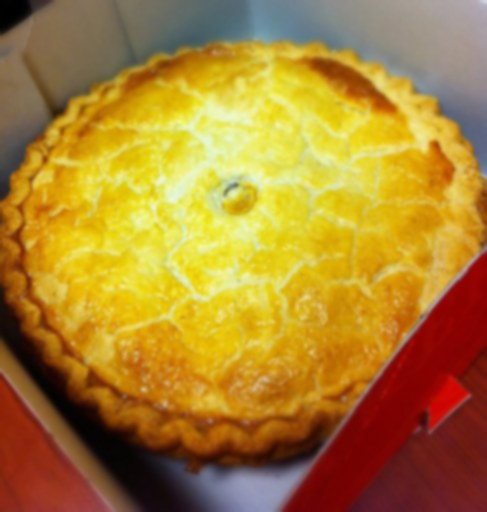

In [10]:
gaussian_blur(img)

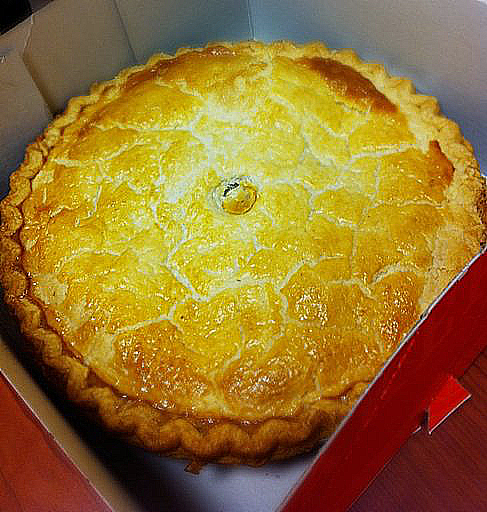

In [11]:
sharpen(img)

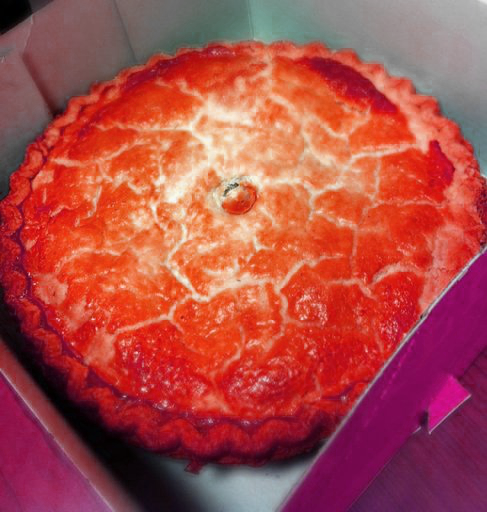

In [12]:
hue_saturation_value(img)

In [13]:
tfm = Transform(gaussian_blur)

In [14]:
class AlbumentationsTransform(Transform):
    def __init__(self, aug): self.aug = aug
    def encodes(self, img: PILImage):
        aug_img = self.aug(image=np.array(img))['image']
        return PILImage.create(aug_img)

In [15]:
hue_saturation_tfm = AlbumentationsTransform(HueSaturationValue(p=0.15))
blur_tfm = AlbumentationsTransform(GaussianBlur(p=0.15))
sharpen_tfm = AlbumentationsTransform(IAASharpen(p=0.15))

In [16]:
food101 = food101.new(item_tfms=[RandomResizedCrop(224, min_scale=0.3), hue_saturation_tfm, blur_tfm, sharpen_tfm], batch_tfms=aug_transforms(
   mult=1.0,
    do_flip=False,
    max_rotate=20.0, #max rotate from 10 to 20
    max_zoom=1, # because we will zoom in resize fn
    max_lighting=0.5, #max lightint from 0.1 to 0.5 - because in the example images lighting varied a lot
    max_warp=0.2,
    p_affine=0.75,))
dls = food101.dataloaders(path)

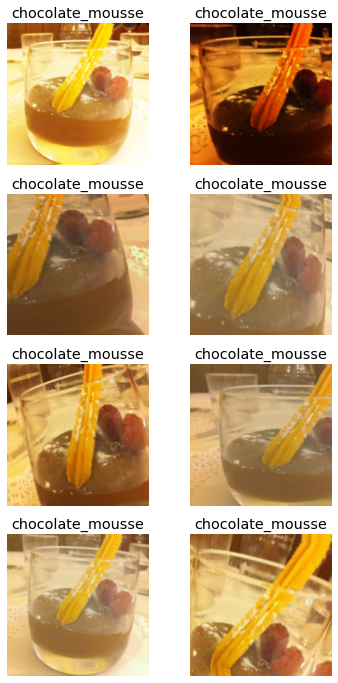

In [40]:
dls.train.show_batch(max_n=8, nrows=4, unique=True)

In [27]:
learn = cnn_learner(dls, resnet34, metrics=metrics)
learn.fine_tune(12)

KeyboardInterrupt: 

In [ ]:
learn.recorder.plot_loss()

In [ ]:
learn.save('more-aug')

### Try cutmix - cutout + mixup combo

In [17]:
cutmix = CutMix(alpha=1.)

In [22]:
food101 = food101.new(item_tfms=RandomResizedCrop(224, min_scale=0.1))
dls = food101.dataloaders(path)

### How cutmix actually looks like

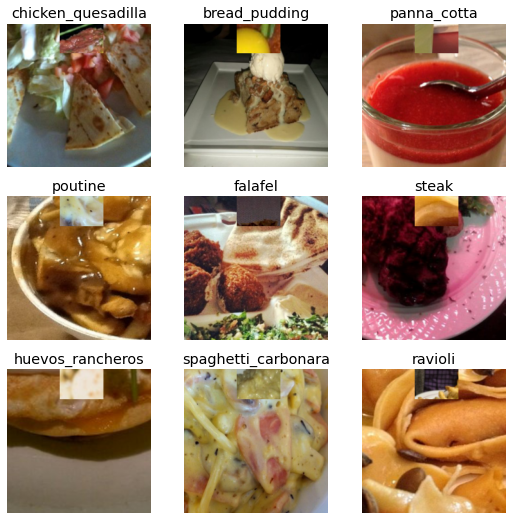

In [24]:
learn  = cnn_learner(dls, resnet34, cbs=cutmix, metrics=metrics)
learn._do_begin_fit(1)
learn.epoch,learn.training = 0,True
learn.dl = dls.train
b = dls.one_batch()
learn._split(b)
learn('begin_batch')
_,axs = plt.subplots(3,3, figsize=(9,9))
dls.show_batch(b=(cutmix.x,cutmix.y), ctxs=axs.flatten())

### Learning with cutmix

In [60]:
learn = cnn_learner(dls, resnet34, metrics=metrics, cbs=cutmix)
learn.fine_tune(12)

epoch,train_loss,valid_loss,error_rate,top_k_accuracy,top_k_accuracy,time
0,3.098437,1.998298,0.504010,0.495990,0.767772,04:31


epoch,train_loss,valid_loss,error_rate,top_k_accuracy,top_k_accuracy,time
0,2.205455,1.414517,0.365000,0.635000,0.858168,06:14
1,1.963759,1.240626,0.327426,0.672574,0.885000,06:14
2,1.778168,1.148049,0.303762,0.696238,0.900792,06:14
3,1.694437,1.087816,0.290792,0.709208,0.905941,06:14
4,1.547295,1.053779,0.275792,0.724208,0.912871,06:14
5,1.414800,0.930496,0.248168,0.751832,0.924752,06:14
6,1.322330,0.873268,0.230495,0.769505,0.932277,06:14
7,1.214339,0.823797,0.216337,0.783663,0.937030,06:14
8,1.155335,0.793972,0.209307,0.790693,0.940248,06:14
9,0.989456,0.743908,0.197327,0.802673,0.943812,06:14


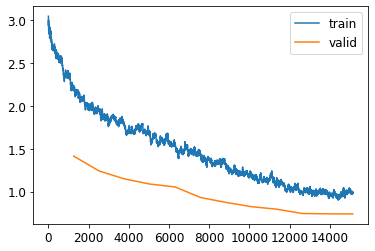

In [61]:
learn.recorder.plot_loss()

In [62]:
learn.save('cutmix')

## Resnet50

In [21]:
learn = cnn_learner(dls, resnet50, metrics=metrics)
learn.fine_tune(12)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /home/jupyter/.cache/torch/checkpoints/resnet50-19c8e357.pth


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,2.035046,1.567125,0.405347,0.594653,06:48


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,1.367171,1.066774,0.280446,0.719554,08:59
1,1.279885,0.980147,0.262574,0.737426,08:59
2,1.141690,0.938289,0.250446,0.749554,08:59
3,0.922731,0.806116,0.216683,0.783317,08:59
4,0.730277,0.736648,0.194307,0.805693,08:59
5,0.552919,0.683822,0.177178,0.822822,08:59
6,0.451144,0.653107,0.169604,0.830396,08:59
7,0.392110,0.645360,0.165891,0.834109,08:59


In [ ]:
learn.save('resnet-50')

## Trainign

In [18]:
cutmix = CutMix(alpha=1.)
cbs = cutmix

In [19]:
item_tfms= [hue_saturation_tfm, blur_tfm, sharpen_tfm]

In [20]:
batch_tfms = aug_transforms(
   mult=1.0,
    do_flip=False,
    max_rotate=20.0,
    max_zoom=1,
    max_lighting=0.5,
    p_affine=0.75,)

In [21]:
item_tfms= [hue_saturation_tfm, blur_tfm, sharpen_tfm]
item_tfms.append(RandomResizedCrop(224, min_scale=0.3))
food101 = food101.new(
    item_tfms=item_tfms,
    batch_tfms=batch_tfms)
dls = food101.dataloaders(path)
learn = cnn_learner(dls, resnet34, metrics=metrics, cbs=cbs)

NameError: name 'metrics' is not defined

In [92]:
learn.fine_tune(12)

epoch,train_loss,valid_loss,error_rate,top_k_accuracy,top_k_accuracy,time
0,3.112107,2.016046,0.504653,0.495347,0.767772,04:46


epoch,train_loss,valid_loss,error_rate,top_k_accuracy,top_k_accuracy,time
0,2.301379,1.434505,0.367525,0.632475,0.856188,06:29
1,1.932288,1.235291,0.320149,0.679851,0.883317,06:28
2,1.755914,1.146321,0.300347,0.699653,0.896931,06:29
3,1.652824,1.088733,0.290149,0.709852,0.909109,06:28
4,1.578336,1.029200,0.269505,0.730495,0.914703,06:29
5,1.452964,0.940367,0.249010,0.750990,0.924554,06:28
6,1.268740,0.881025,0.232574,0.767426,0.930495,06:29
7,1.161235,0.823826,0.218515,0.781485,0.936436,06:28
8,1.091648,0.784455,0.208020,0.791980,0.939604,06:29
9,1.006616,0.757467,0.198663,0.801337,0.942574,06:29


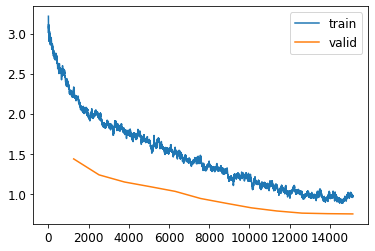

In [93]:
learn.recorder.plot_loss()

In [96]:
learn.save('simple-1')

In [33]:
learn.load('simple-1')

In [34]:
learn.unfreeze()

SuggestedLRs(lr_min=0.00010000000474974513, lr_steep=9.12010818865383e-07)

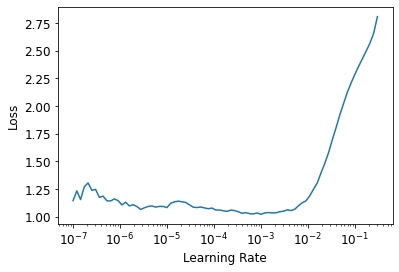

In [35]:
learn.lr_find()

In [36]:
learn.fit_one_cycle(12, max_lr=3e-4)

epoch,train_loss,valid_loss,error_rate,top_k_accuracy,top_k_accuracy,time
0,1.120685,0.883836,0.232921,0.767079,0.928416,10:11
1,1.454107,1.139825,0.299653,0.700347,0.899703,06:19
2,1.577964,1.226242,0.319851,0.680149,0.885297,06:20
3,1.576130,1.203575,0.313366,0.686634,0.891040,06:20
4,1.490047,1.071755,0.279901,0.720099,0.906634,06:20
5,1.358023,1.059565,0.275347,0.724653,0.907624,06:20
6,1.252926,0.932132,0.243168,0.756832,0.921832,06:20
7,1.157142,0.873726,0.228762,0.771238,0.928317,06:20
8,0.991946,0.818447,0.214851,0.785149,0.934109,06:20
9,0.937925,0.795504,0.205941,0.794059,0.937277,06:20


In [37]:
learn.save('simple-2')

In [ ]:
learn.load('simple-1')

In [ ]:
learn.fit_one_cycle(18, max_lr=3e-4)

SuggestedLRs(lr_min=7.585775847473997e-08, lr_steep=1.737800812406931e-05)

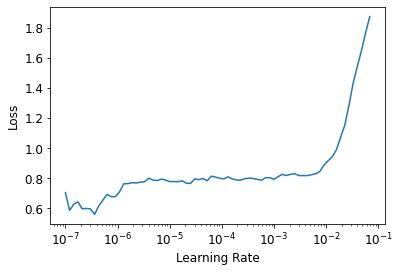

In [38]:
learn.lr_find()

In [39]:
learn.fit_one_cycle(12, max_lr=slice(2e-7, 3e-5))

epoch,train_loss,valid_loss,error_rate,top_k_accuracy,top_k_accuracy,time
0,0.933815,0.811397,0.210297,0.789703,0.936386,06:20
1,1.166722,0.961910,0.247277,0.752723,0.922129,06:20
2,1.296475,1.077481,0.281139,0.718861,0.909059,06:20
3,1.303863,1.070249,0.278861,0.721139,0.908416,06:20
4,1.282918,1.056324,0.273861,0.726139,0.910990,06:20
5,1.107521,0.942560,0.245347,0.754653,0.925495,06:20
6,1.075651,0.884333,0.229158,0.770842,0.930644,06:20
7,0.966020,0.835891,0.216188,0.783812,0.933564,06:20
8,0.894674,0.798261,0.205000,0.795000,0.939158,06:20
9,0.768386,0.758856,0.196832,0.803168,0.944010,06:20


In [40]:
learn.save('simple-2-1')

In [41]:
learn.load('simple-2')

In [42]:
learn.fit_one_cycle(12, max_lr=slice(2e-6, 3e-4))

epoch,train_loss,valid_loss,error_rate,top_k_accuracy,top_k_accuracy,time
0,0.879764,0.795019,0.205644,0.794356,0.937129,06:20
1,1.153460,0.962363,0.247822,0.752178,0.920594,06:20
2,1.296335,1.075214,0.280495,0.719505,0.909356,06:20
3,1.328714,1.070616,0.279158,0.720842,0.907673,06:20
4,1.247866,1.016163,0.264604,0.735396,0.914653,06:20
5,1.188644,0.977309,0.253564,0.746436,0.918762,06:20
6,1.186563,0.908573,0.232525,0.767475,0.927624,06:20
7,0.991630,0.849555,0.220594,0.779406,0.933861,06:20
8,0.824517,0.780512,0.202178,0.797822,0.940743,06:20
9,0.863699,0.762903,0.193911,0.806089,0.943069,06:20


In [44]:
learn.save('simple-2-2')

### 512x512 resolution

In [26]:
item_tfms= [hue_saturation_tfm, blur_tfm, sharpen_tfm]
item_tfms.append(RandomResizedCrop(512, min_scale=0.3))
food101 = food101.new(
    item_tfms=item_tfms,
    batch_tfms=batch_tfms)
dls = food101.dataloaders(path)
learn = cnn_learner(dls, resnet34, metrics=metrics, cbs=cbs)

In [45]:
learn.load('simple-2')

SuggestedLRs(lr_min=0.0015848932787775993, lr_steep=1.3182567499825382e-06)

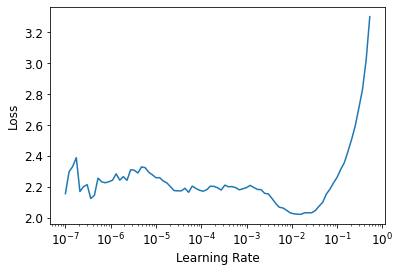

In [46]:
learn.lr_find()

In [47]:
learn.fit_one_cycle(12, max_lr=2e-3)

epoch,train_loss,valid_loss,error_rate,top_k_accuracy,top_k_accuracy,time
0,1.273275,0.760603,0.203812,0.796188,0.942822,21:33
1,1.171416,0.734591,0.196832,0.803168,0.944752,21:33
2,1.109215,0.729894,0.193267,0.806733,0.945743,21:33
3,1.094295,0.733338,0.194010,0.805990,0.947574,21:34
4,1.120320,0.725423,0.191040,0.808960,0.947030,21:34
5,1.139444,0.727928,0.194208,0.805792,0.947921,21:34
6,1.020304,0.694897,0.182228,0.817772,0.950396,21:34
7,1.023175,0.690601,0.183762,0.816238,0.950594,21:34
8,1.045083,0.680254,0.179257,0.820743,0.952723,21:33
9,1.004921,0.679800,0.178069,0.821931,0.953069,21:33


In [48]:
learn.save('simple-2-512-2')

In [40]:
learn.load('simple-2-512-2')

In [ ]:
learn.fit_one_cycle(6, max_lr=2e-3)

epoch,train_loss,valid_loss,error_rate,top_k_accuracy,top_k_accuracy,time
0,1.131333,0.998164,0.255347,0.744653,0.917970,06:28
1,1.365400,1.111349,0.288713,0.711287,0.903416,06:29
2,1.223112,0.978976,0.258069,0.741931,0.919554,06:29
3,1.083415,0.856080,0.225297,0.774703,0.933861,06:29
4,0.851394,0.773477,0.201436,0.798564,0.941287,06:29


In [ ]:
learn.recorder.plot_loss()

In [ ]:
learn.save('simple-2-512-3a')

In [36]:
learn.load('simple-2-512-2')

In [27]:
learn.unfreeze()

SuggestedLRs(lr_min=0.00036307806149125097, lr_steep=7.585775847473997e-07)

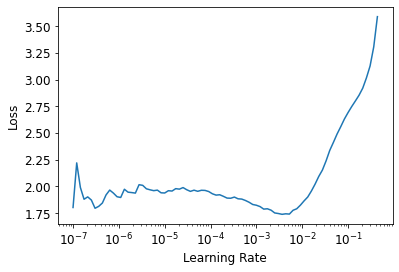

In [28]:
learn.lr_find()

In [37]:
learn.fit_one_cycle(12, max_lr=slice(3e-6, 2e-4))

epoch,train_loss,valid_loss,error_rate,top_k_accuracy,top_k_accuracy,time
0,0.976973,0.852480,0.216881,0.783119,0.931287,06:28
1,1.218899,1.012711,0.261782,0.738218,0.915347,06:28
2,1.337779,1.079674,0.279158,0.720842,0.908564,06:28
3,1.321993,1.051724,0.275495,0.724505,0.908465,06:28
4,1.248983,1.024179,0.264752,0.735248,0.914604,06:28
5,1.170764,0.963666,0.246980,0.753020,0.921089,06:28
6,1.017557,0.868150,0.228713,0.771287,0.932574,06:28
7,0.991908,0.849173,0.219703,0.780297,0.932970,06:28
8,0.822673,0.781009,0.201139,0.798861,0.940891,06:28
9,0.821877,0.763344,0.193366,0.806634,0.942970,06:28


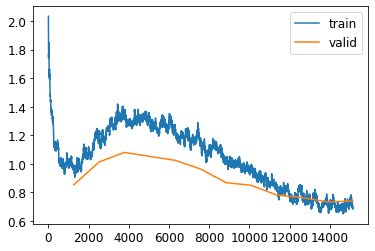

In [38]:
learn.recorder.plot_loss()

In [39]:
learn.save('simple-2-512-3')

In [31]:
learn.load('simple-2-512-3')

In [27]:
learn.unfreeze()

SuggestedLRs(lr_min=0.0007585775572806596, lr_steep=8.31763736641733e-06)

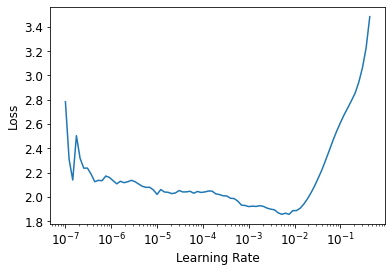

In [28]:
learn.lr_find()

In [ ]:
learn.fit_one_cycle(12, max_lr=slice(6e-6, 3e-4))

epoch,train_loss,valid_loss,error_rate,top_k_accuracy,top_k_accuracy,time
0,0.958471,0.669048,0.177673,0.822327,0.954109,29:35
1,1.093106,0.767200,0.206188,0.793812,0.945297,29:19
2,1.159936,0.968506,0.251832,0.748168,0.923614,29:19
3,1.079322,0.830106,0.215495,0.784505,0.937574,29:19
4,1.066176,0.783980,0.206139,0.793861,0.941287,29:19
5,0.987073,0.715683,0.188614,0.811386,0.951782,29:19
6,0.840857,0.668321,0.175248,0.824752,0.953069,29:19
7,0.759953,0.645430,0.167129,0.832871,0.956287,29:19
8,0.641448,0.604157,0.157079,0.842921,0.960941,29:19
9,0.594395,0.575497,0.147277,0.852723,0.963119,29:19


In [ ]:
learn.save('simple-2-512-4')

In [ ]:
learn.load('simple-2-512-4')

SuggestedLRs(lr_min=1.0964781722577755e-07, lr_steep=3.311311274956097e-06)

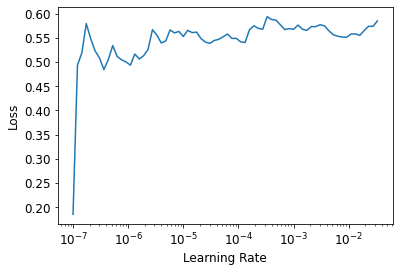

In [48]:
learn.lr_find()

In [ ]:
#learn.fit_one_cycle(12, max_lr=slice(5e-7, 3e-5))

epoch,train_loss,valid_loss,error_rate,top_k_accuracy,top_k_accuracy,time


In [ ]:
#learn.save('simple-2-512-5')

In [ ]:
#learn.load('simple-2-512-5')

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)

In [ ]:
confused = interp.most_confused(min_val=3)

In [ ]:
interp.plot_confusion_matrix()

### Testing on proper dataset (with curated test set)

In [33]:
path_proper = untar_data(URLs.FOOD)

In [35]:
path_proper

Path('/home/jupyter/.fastai/data/food-101')

In [34]:
path_proper.ls()

[Path('/home/jupyter/.fastai/data/food-101/labels.txt'),
 Path('/home/jupyter/.fastai/data/food-101/h5'),
 Path('/home/jupyter/.fastai/data/food-101/images'),
 Path('/home/jupyter/.fastai/data/food-101/test.json'),
 Path('/home/jupyter/.fastai/data/food-101/test.txt'),
 Path('/home/jupyter/.fastai/data/food-101/train.json'),
 Path('/home/jupyter/.fastai/data/food-101/train.txt'),
 Path('/home/jupyter/.fastai/data/food-101/classes.txt')]

In [128]:
train_path = path_proper/'train.txt'
test_path = path_proper/'test.txt'
def filelist2df(path):
    df = pd.read_csv(path, delimiter='/', header=None, names=['label', 'name'])
    df['name'] =  df['label'].astype(str) + "/" + df['name'].astype(str) + ".jpg"
    return df

train_df = filelist2df(train_path)
train_df['is_valid'] = False
test_df = filelist2df(test_path)
test_df['is_valid'] = True

In [165]:
test_df.head(), len(test_df)

(       label                   name  is_valid
 0  apple_pie  apple_pie/1011328.jpg      True
 1  apple_pie   apple_pie/101251.jpg      True
 2  apple_pie  apple_pie/1034399.jpg      True
 3  apple_pie   apple_pie/103801.jpg      True
 4  apple_pie  apple_pie/1038694.jpg      True,
 25250)

In [130]:
df = pd.concat([train_df, test_df])

In [131]:
df.head()

,label,name,is_valid
0,apple_pie,apple_pie/1005649.jpg,False
1,apple_pie,apple_pie/1014775.jpg,False
2,apple_pie,apple_pie/1026328.jpg,False
3,apple_pie,apple_pie/1028787.jpg,False
4,apple_pie,apple_pie/1043283.jpg,False


In [118]:
images = path_proper/'images'

In [152]:
def get_x(d): return images/d['name']
def get_y(d): return d['label']

In [161]:
food101_proper = DataBlock(
        blocks=(ImageBlock, CategoryBlock),
        splitter=ColSplitter(),
        get_x=get_x,
        get_y=get_y,
       item_tfms=Resize(512)
)

In [162]:
food101_proper.summary(df)

Setting-up type transforms pipelines
0      apple_pie  apple_pie/1005649.jpg     False
1      apple_pie  apple_pie/1014775.jpg     False
2      apple_pie  apple_pie/1026328.jpg     False
3      apple_pie  apple_pie/1028787.jpg     False
4      apple_pie  apple_pie/1043283.jpg     False
...          ...                    ...       ...
25245    waffles     waffles/942009.jpg      True
25246    waffles     waffles/954028.jpg      True
25247    waffles      waffles/96181.jpg      True
25248    waffles      waffles/97015.jpg      True
25249    waffles     waffles/971843.jpg      True

[101000 rows x 3 columns]
Found 101000 items
2 datasets of sizes 75750,25250
Setting up Pipeline: get_x -> PILBase.create
Setting up Pipeline: get_y -> Categorize

Building one sample
  Pipeline: get_x -> PILBase.create
    starting from
      label                   apple_pie
name        apple_pie/1005649.jpg
is_valid                    False
Name: 0, dtype: object
    applying get_x gives
      /home/jupyte

In [163]:
dls_proper = food101_proper.dataloaders(df)

In [167]:
item_tfms= [hue_saturation_tfm, blur_tfm, sharpen_tfm]
item_tfms.append(RandomResizedCrop(512, min_scale=0.3))
food101 = food101_proper.new(
    item_tfms=item_tfms,
    batch_tfms=batch_tfms)
dls = food101.dataloaders(df)
learn = cnn_learner(dls_proper, resnet34, metrics=metrics, cbs=cbs)

In [168]:
learn.load('simple-2-512-4')

SuggestedLRs(lr_min=2.7542287170945203e-07, lr_steep=7.585775847473997e-07)

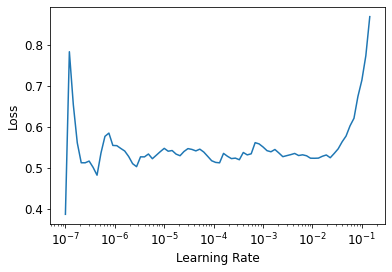

In [169]:
learn.lr_find()

In [ ]:
learn.fit_one_cycle(4, max_lr=slice(5e-7, 3e-5))

epoch,train_loss,valid_loss,error_rate,top_k_accuracy,top_k_accuracy,time
0,0.477742,0.178298,0.050535,0.949465,0.993624,20:10
1,0.487077,0.173256,0.048396,0.951604,0.993505,20:11


In [ ]:
learn.save('final')

### Things that may make the model better AKA TODO:
- curriculum learning
- curriculum dropouts
- mixed precision
- different loss function
- more transforms from albumations
- try fastai sizing trick (first resize in item tfms, second in batch tfms)

In [ ]:
shutdown()